# SS-DDPM on geodesic data
https://www.earthdata.nasa.gov/learn/get-started

Here you can find simple examples how to use the SS-DDPM for data on the earth sphere. This is just examples that not tuned to achieve sota perfomance. We use von Mises Fisher distribution - distribution of points on 2d sphere. We use one set of hyperparams and same training/sampling procedures for all datasets.

# Dependencies

In [1]:
import os
import shutil
from IPython.display import clear_output
import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload

In [2]:
import torch
from ml_collections import ConfigDict
from matplotlib import pyplot as plt

In [3]:
import sys
sys.path.append('../lib')

from pipelines.UniversalDiffusionTrainer import UniversalDiffusionTrainer
from pipelines.UniversalDiffusionSampler import UniversalDiffusionSampler
from pipelines.StarShapedDequantizatorTrainer import StarShapedDequantizatorTrainer
from pipelines.UniversalNLLEstimator import UniversalNLLEstimator

from data.Datasets import init_dataset
from diffusion.Diffusion import init_diffusion
from models.Models import init_model

from visualization_utils.PlotManifolds import sphere_plot, plot_sphere_result
from visualization_utils.PlotSS import plot_xt_ss_process, get_Gt_samples, plot_xt_samples
from visualization_utils.Plots import plot_loss, plot_metrics

from console_scripts.cluster_utils import save_config
from pipelines.fix_seed import fix_seed
from saving_utils.get_repo_root import get_repo_root

geodesic_folder = os.path.join(get_repo_root(), 'results', 'geodesic')
if not os.path.exists(geodesic_folder):
    os.mkdir(geodesic_folder)
geodesic_path = lambda path: os.path.join(geodesic_folder, path)

2023-11-29 14:31:32.683047: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Pipelines

##### plot points from dataset

In [4]:
def plot_dataset(disaster):
    dataset_config = ConfigDict({
        'name' : 'disasters',
        'disaster' : disaster,
        'batch_size' : 128,
        'num_workers' : 5,
        'split_seed' : 123,
        'save_split' : None
    })
    dataset = init_dataset(dataset_config)
    
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)
    sphere_plot(ax, dataset.train_loader.dataset.coords)
    plt.title(disaster, fontsize=16)
    plt.show()
    pass

##### plot ss-ddpm forward processes

In [5]:
def plot_vmf_ss_forward_processes(disaster):
    vmf_config = ConfigDict({
        'method'       : 'VonMisesFisherStarShaped',
        'object_shape' : (1, 1, 3),
        'num_steps'    : 100,
        'scheduler'    : 'default_von_mises_fisher'
    })
    vmfss = init_diffusion(vmf_config)
    
    # get dataset
    dataset_config = ConfigDict({
        'name' : 'disasters',
        'disaster' : disaster,
        'batch_size' : 128,
        'num_workers' : 5,
        'split_seed' : 123,
        'save_split' : None
    })
    dataset = init_dataset(dataset_config)

    # plot xt forward process
    plot_xt_ss_process(
        ss=vmfss, 
        num_objects=1e+9,
        dataset=dataset,
        manifold_visualization=sphere_plot,
        fpath=geodesic_path(f'von-mises-fisher-ss_{disaster}_forward-process.png')
    )
    
    # plot Gt forward process
    list_Gt, time_points = get_Gt_samples(
        ss=vmfss, 
        M=1e+9, 
        dataset=dataset
    )
    normed_Gt = [ vmfss.time_dependent_tail_normalization(Gt, None) for Gt in list_Gt ]
    plot_xt_samples(
        normed_Gt,
        time_points,
        sphere_plot,
        fpath=geodesic_path(f'von-mises-fisher-ss_{disaster}_Gt-forward-process.png'),
        title='G_t'
    )
    pass

##### training

In [6]:
def run_training(
    **kwargs
):
    config, process = geodesic_config(**kwargs)
    save_config(config, process.rank)
    trainer = UniversalDiffusionTrainer(
        config, 
        process.rank
    )
    trainer.train(
        process,
        fprint=print
    )
    return trainer

##### load trained model

In [7]:
def load_trained_model(save_file):
    config = ConfigDict({
        'model_name' : 'MLP',
        'model_config' : ConfigDict({
            'pretrained_model' : save_file
        })
    })
    model = init_model(config)
    return model

##### sampling

In [8]:
def run_sampling(
    model,
    num_samples,
    **kwargs
):
    # sample points
    config, process = geodesic_config(**kwargs)
    sampler = UniversalDiffusionSampler(config, process)
    if num_samples == 'as_dataset':
        num_samples = len(sampler.data_generator.train_dataset)
    sampler.model = model
    sampler.sample(
        num_samples,
        process,
        fprint=print
    )
    clear_output()
    # plot points
    folder = os.path.join(
        get_repo_root(), 'results', config.save_folder,
        'generated_samples'
    )
    generated_coords = []
    for f in os.listdir(folder):
        if f[-3:] == '.pt':
            generated_coords.append(torch.load(os.path.join(folder, f)).cpu())
    generated_coords = torch.vstack(generated_coords).reshape(-1,3)
    disaster = kwargs['disaster']
    plot_sphere_result(
        sampler.data_generator.train_dataset.coords, 
        generated_coords, 
        f'VMF SS-DDPM on {disaster}',
        graphic_path=geodesic_path(f'vmf-ss-ddpm_{disaster}_generation-results')
    )
    return sampler, generated_coords

# Config

In [9]:
def geodesic_config(
    disaster,
    batch_size,
    folder,
    gpu,
    logs_file
):
    # experiment config
    config = ConfigDict({})
    config.diffusion = ConfigDict({
        'method'       : 'VonMisesFisherStarShaped',
        'object_shape' : (1, 1, 3),
        'num_steps'    : 100,
        'scheduler'    : 'default_von_mises_fisher'
    })
    config.num_sampling_steps = 100
    config.model = ConfigDict({
        'model_name' : 'MLP',
        'model_config' : ConfigDict({
            'default' : 'mlp-sphere'
        })
    })
    config.data = ConfigDict({
        'name'        : 'disasters',
        'disaster'    : disaster,
        'batch_size'  : batch_size,
        'num_workers' : 5,
        'split_seed'  : 123,
        'save_split'  : None
    })
    config.loss = ConfigDict({
        'method' : 'KL'
    })
    config.n_epochs = 4000
    config.optimization_config = ConfigDict({
        'optimizer' : {
            'method' : 'Adam',
            'config' : { 'lr' : 1e-4 }
        },
        'ema' : {
            'ema_rate' : 0.999,
            'initial_acceleration' : True
        },
        'clip_grad_norm' : 1.0
    })
    config.metrics_config = ConfigDict({
        'validation_freq' : 200,
        'metrics_list' : [
            {
                'method' : 'KL',
                'mode' : 'train',
                'episodes' : [ 0 ],
                'freq' : 20
            },
            {
                'method' : 'KL_rescaled',
                'mode' : 'train',
                'episodes' : [ 0 ],
                'freq' : 20
            }
        ]
    })
    config.logger = ConfigDict({
        'folder' : folder,
        'saving_freq' : 1,
        'reset_previous' : True
    })
    config.checkpoints = ConfigDict({
        'folder' : folder,
        'saving_freq' : 200,
        'reset_previous' : True
    })
    config.dequantizator = ConfigDict({
        'model_name' : 'Dequantizator',
        'model_config' : ConfigDict({
            'default' : 'von_mises_fisher'
        })
    })
    config.save_folder = folder
    config.logs_file = logs_file
    
    # process config
    process = ConfigDict()
    process.rank = 0
    process.world_size = 1
    process.is_root_process = True
    process.gpu = gpu
    process.distributed = False
    
    save_config(config, process.rank)  
    return config, process

# DATASET: Fire

In [10]:
dataset_name = 'fire'

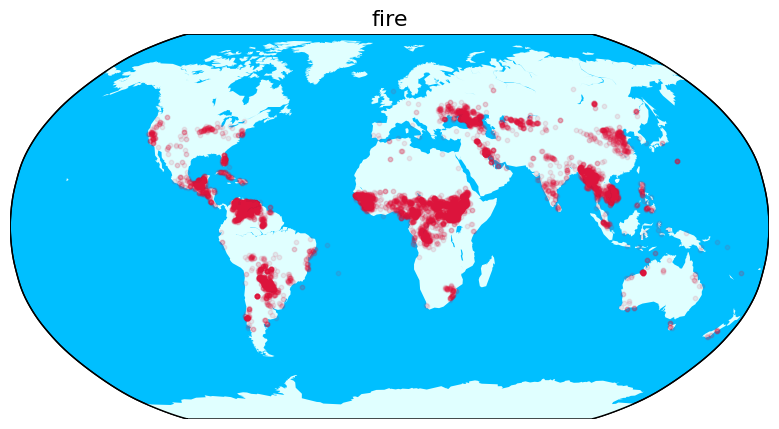

In [11]:
plot_dataset(dataset_name)

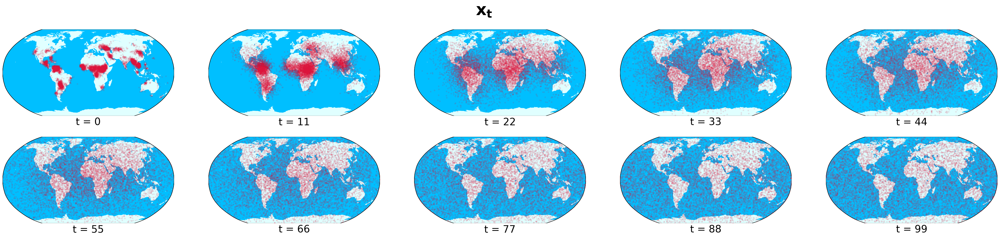

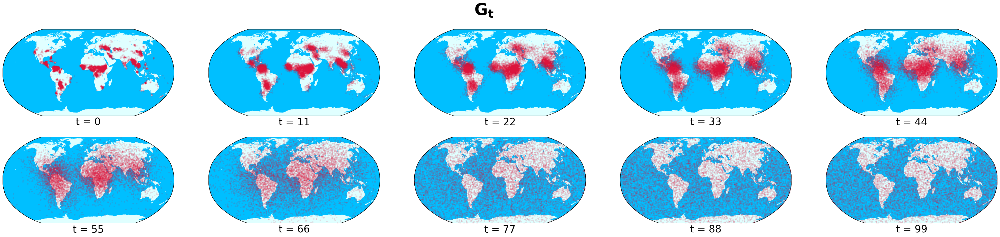

In [12]:
plot_vmf_ss_forward_processes(dataset_name)

In [13]:
"""
trainer = run_training(
    disaster=dataset_name,
    batch_size=128,
    folder=f'training_{dataset_name}_vmfss',
    gpu=0,
    logs_file='logs_training_vmf_ss.txt'
)
"""

"\ntrainer = run_training(\n    disaster=dataset_name,\n    batch_size=128,\n    folder=f'training_{dataset_name}_vmfss',\n    gpu=0,\n    logs_file='logs_training_vmf_ss.txt'\n)\n"

In [14]:
model = load_trained_model(f'mlp-sphere_{dataset_name}_vmf-ss-ddpm.pt')

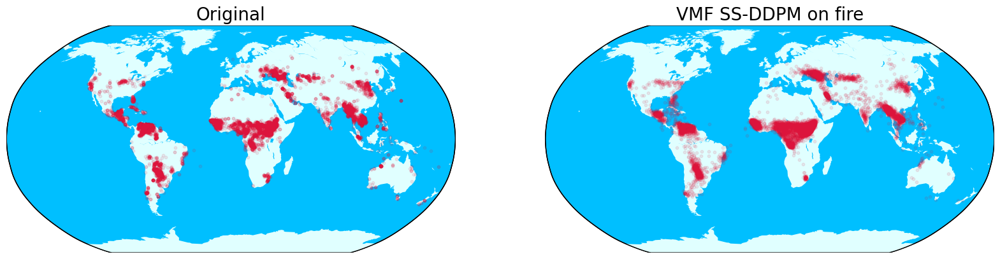

In [15]:
sampler, model_samples = run_sampling(
    model=model,
    num_samples='as_dataset',
    disaster=dataset_name,
    batch_size=1024,
    folder=f'sampling_{dataset_name}_vmfss',
    logs_file='logs_sampling_vmf_ss.txt',
    gpu=0
)

# DATASET: Flood

In [16]:
dataset_name = 'flood'

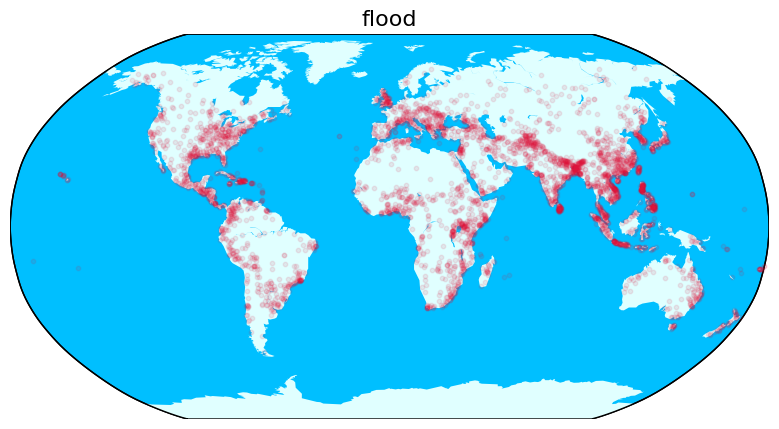

In [17]:
plot_dataset(dataset_name)

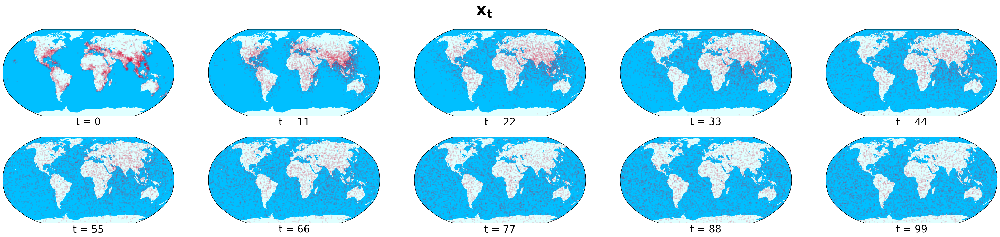

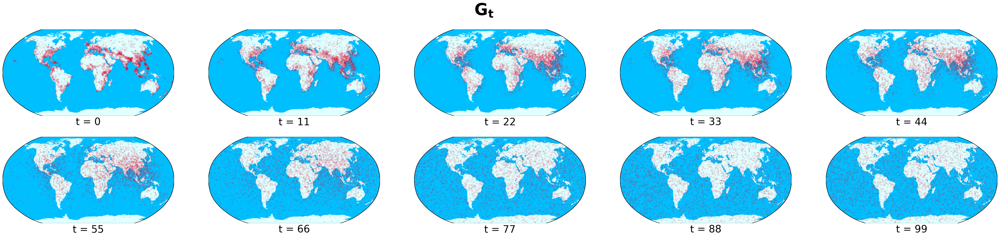

In [18]:
plot_vmf_ss_forward_processes(dataset_name)

In [19]:
"""
trainer = run_training(
    disaster=dataset_name,
    batch_size=128,
    folder=f'training_{dataset_name}_vmfss',
    gpu=0,
    logs_file='logs_training_vmf_ss.txt'
)
"""

"\ntrainer = run_training(\n    disaster=dataset_name,\n    batch_size=128,\n    folder=f'training_{dataset_name}_vmfss',\n    gpu=0,\n    logs_file='logs_training_vmf_ss.txt'\n)\n"

In [20]:
model = load_trained_model(f'mlp-sphere_{dataset_name}_vmf-ss-ddpm.pt')

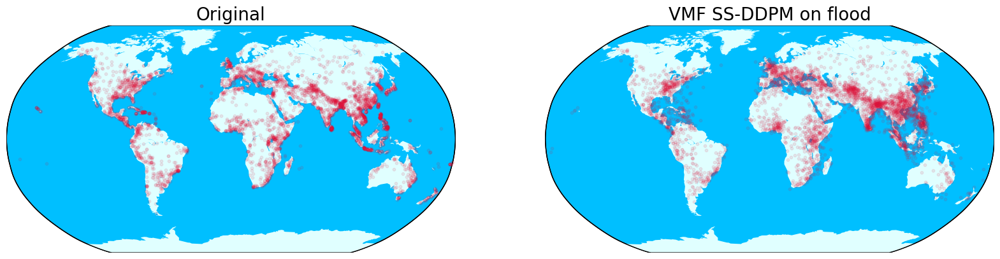

In [21]:
sampler, model_samples = run_sampling(
    model=model,
    num_samples='as_dataset',
    disaster=dataset_name,
    batch_size=1024,
    folder=f'sampling_{dataset_name}_vmfss',
    logs_file='logs_sampling_vmf_ss.txt',
    gpu=0
)

# DATASET: Earthquake

In [22]:
dataset_name = 'earthquake'

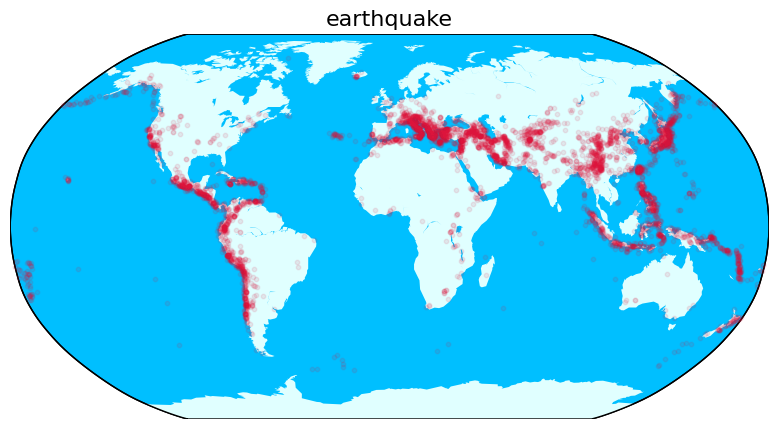

In [23]:
plot_dataset(dataset_name)

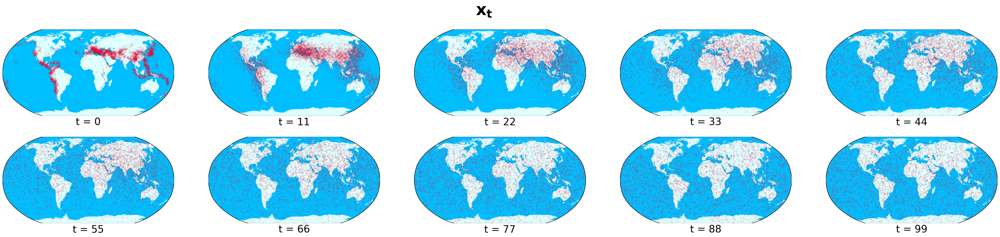

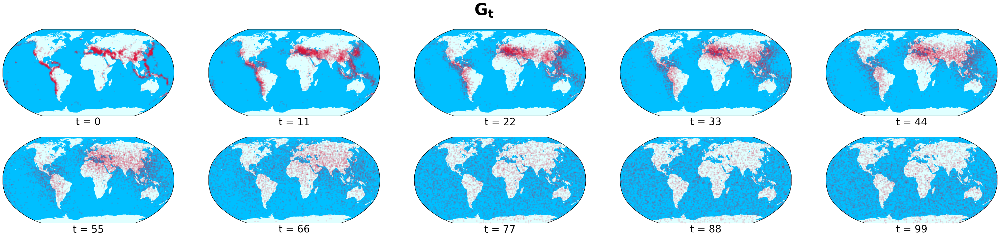

In [24]:
plot_vmf_ss_forward_processes(dataset_name)

In [25]:
"""
trainer = run_training(
    disaster=dataset_name,
    batch_size=128,
    folder=f'training_{dataset_name}_vmfss',
    gpu=0,
    logs_file='logs_training_vmf_ss.txt'
)
"""

"\ntrainer = run_training(\n    disaster=dataset_name,\n    batch_size=128,\n    folder=f'training_{dataset_name}_vmfss',\n    gpu=0,\n    logs_file='logs_training_vmf_ss.txt'\n)\n"

In [26]:
model = load_trained_model(f'mlp-sphere_{dataset_name}_vmf-ss-ddpm.pt')

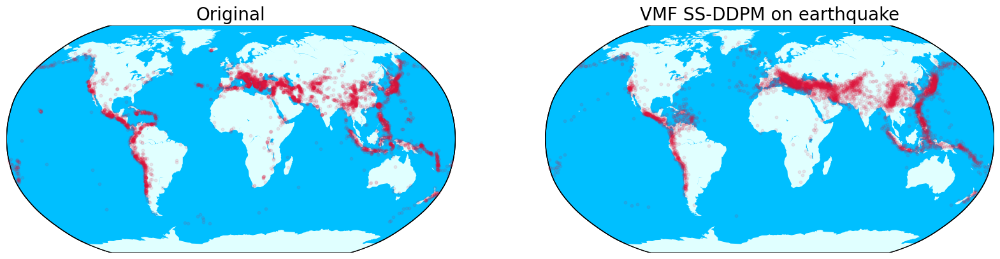

In [27]:
sampler, model_samples = run_sampling(
    model=model,
    num_samples='as_dataset',
    disaster=dataset_name,
    batch_size=1024,
    folder=f'sampling_{dataset_name}_vmfss',
    logs_file='logs_sampling_vmf_ss.txt',
    gpu=0
)

# DATASET: Volcano

In [28]:
dataset_name = 'volcano'

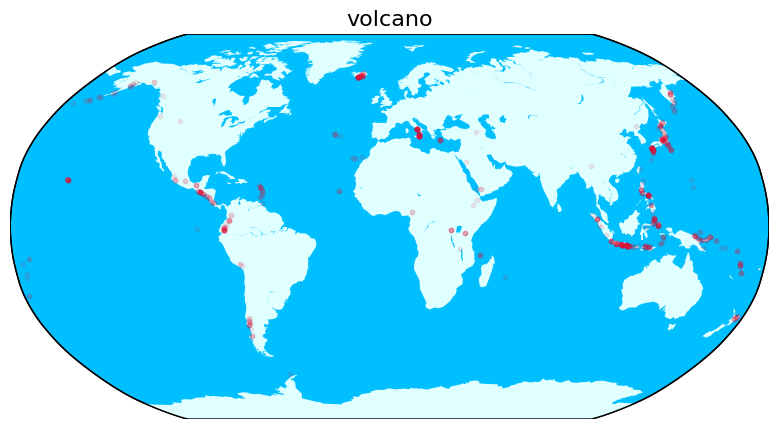

In [29]:
plot_dataset(dataset_name)

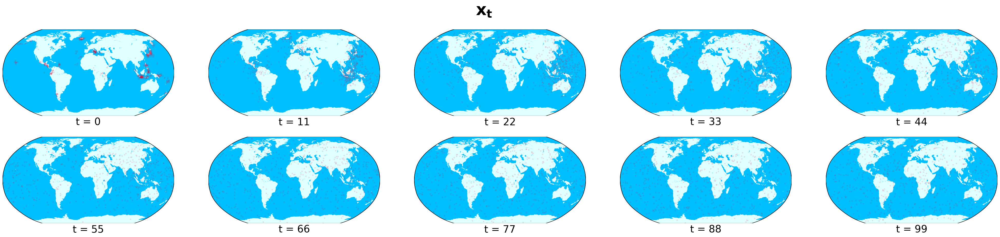

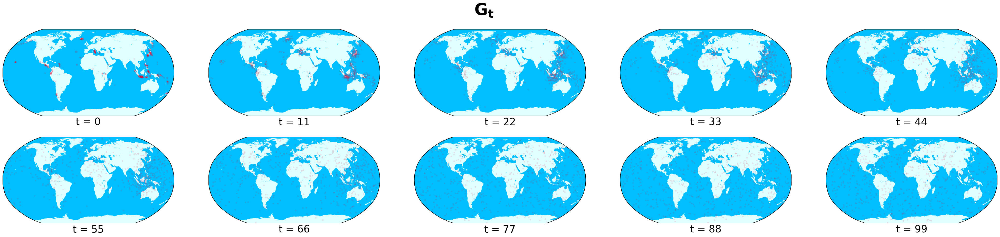

In [30]:
plot_vmf_ss_forward_processes(dataset_name)

In [31]:
"""
trainer = run_training(
    disaster=dataset_name,
    batch_size=128,
    folder=f'training_{dataset_name}_vmfss',
    gpu=0,
    logs_file='logs_training_vmf_ss.txt'
)
"""

"\ntrainer = run_training(\n    disaster=dataset_name,\n    batch_size=128,\n    folder=f'training_{dataset_name}_vmfss',\n    gpu=0,\n    logs_file='logs_training_vmf_ss.txt'\n)\n"

In [32]:
model = load_trained_model(f'mlp-sphere_{dataset_name}_vmf-ss-ddpm.pt')

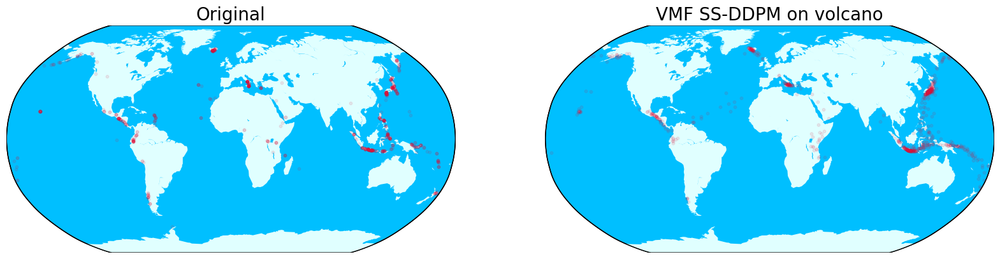

In [33]:
sampler, model_samples = run_sampling(
    model=model,
    num_samples='as_dataset',
    disaster=dataset_name,
    batch_size=1024,
    folder=f'sampling_{dataset_name}_vmfss',
    logs_file='logs_sampling_vmf_ss.txt',
    gpu=0
)